# Training

In [ ]:
!pip install -qq opendatasets

In [ ]:
import opendatasets as od

In [ ]:
url = 'https://www.kaggle.com/adityajn105/flickr8k'

In [ ]:
od.download(url)

  0%|          | 0.00/1.04G [00:00<?, ?B/s]

100%|██████████| 1.04G/1.04G [00:18<00:00, 59.4MB/s]


In [ ]:
!ls /content/flickr8k

captions.txt  Images


In [ ]:
!pip install -qq transformers
!pip install -U -qq sentence-transformers

     |████████████████████████████████| 2.0MB 8.7MB/s 
     |████████████████████████████████| 3.2MB 47.6MB/s 
     |████████████████████████████████| 890kB 54.9MB/s 
     |████████████████████████████████| 81kB 5.7MB/s 
     |████████████████████████████████| 1.2MB 15.5MB/s 


In [ ]:
from fastai import *
from fastai.vision import *
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('/content/flickr8k/captions.txt')

In [ ]:
df.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [ ]:
df.drop_duplicates(subset='image', keep='first', inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8091 entries, 0 to 40450
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   image    8091 non-null   object
 1   caption  8091 non-null   object
dtypes: object(2)
memory usage: 189.6+ KB


In [ ]:
from sentence_transformers import SentenceTransformer
sentence_embedder = SentenceTransformer('roberta-large-nli-stsb-mean-tokens')

In [ ]:
%%time
sentence_embeddings = sentence_embedder.encode(df.caption.values.tolist(),batch_size=512,show_progress_bar=True)



CPU times: user 24min 34s, sys: 12.5 s, total: 24min 47s
Wall time: 24min 41s


In [ ]:
train_df = pd.DataFrame(sentence_embeddings)
train_df['image'] = df['image'].values
train_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,image
0,1.128611,-1.167202,0.161455,-0.422154,0.210362,-1.320693,0.019469,0.974567,-0.416308,0.621144,0.006613,1.277014,0.326745,-0.023470,-0.038430,0.447157,-0.372103,0.169727,0.972920,0.942361,0.468370,-1.250368,2.144510,0.270725,1.310774,-0.357840,0.353179,0.746548,0.226337,-1.038311,-0.053317,-0.126102,0.893719,-0.853390,0.546934,1.298386,1.039310,0.436798,0.176283,-1.169107,...,1.182024,0.493440,0.857777,-0.078351,-1.051392,-0.660794,0.837266,0.384489,0.080627,-0.713254,-0.424615,0.387072,-2.441638,-1.451962,-0.380410,0.406200,0.212047,-1.872115,0.976232,-0.909028,-1.108286,-0.016100,0.494865,-0.905365,0.263065,-1.193145,-0.622715,-0.426038,0.275373,-1.009669,-1.957973,-0.923101,-0.475540,-0.006143,0.298562,0.402878,-0.005190,-1.123840,0.404949,1000268201_693b08cb0e.jpg
1,-1.051988,0.618283,-0.407576,1.280349,-0.864411,-0.538769,-0.164061,-0.531146,0.650991,0.366640,0.603350,0.799293,-0.176013,-0.756257,-0.226819,-1.529034,-0.277598,0.138287,0.779066,-0.613704,0.718587,-0.687898,-0.515034,-1.317024,-0.765508,-0.056955,0.025755,0.339710,-0.607661,-0.437603,-0.067755,0.739521,-0.722118,-0.133038,0.238649,0.475112,-0.148755,-0.474389,-0.247159,-0.548302,...,-0.206442,0.236271,-0.391590,0.182354,-0.586384,-1.203945,-0.015693,-0.301223,-0.912316,1.356170,-0.065579,0.541723,0.758514,0.441902,0.691537,-0.981001,0.477838,-2.227120,-0.028888,-0.320025,-0.037484,-0.005772,-1.288869,-0.288637,-0.021953,-0.334251,0.082553,0.653381,0.019324,1.865693,1.686496,0.796976,-0.902098,0.214463,1.393117,-0.681312,-0.903300,-0.621468,0.389954,1001773457_577c3a7d70.jpg
2,-0.346822,0.578002,0.032314,-0.789248,-0.367413,0.580470,0.251244,0.611226,-0.755475,0.308123,0.376034,-1.367601,1.352142,0.884127,0.197039,-1.019684,0.508698,0.003288,-0.213483,1.026416,-0.765202,-1.807014,0.600185,-0.701922,0.479143,0.228621,-0.558563,0.074860,0.019291,-0.851659,-0.383032,0.610889,0.593434,-0.377107,-1.643620,-1.338172,-0.435395,-0.837765,0.016466,0.101627,...,0.703420,0.346356,-0.306171,0.592614,0.152290,0.273025,-0.796922,0.699232,0.884981,0.899130,0.841494,0.530514,-2.331110,-1.118942,0.336926,-0.058700,-0.875106,-2.155310,1.039623,0.239455,0.484011,0.652376,-0.659656,-0.232606,1.280621,0.285845,-0.812281,-0.041344,0.691991,0.510851,-0.390670,0.034354,1.273288,-1.359936,1.069887,0.979817,-0.358636,-1.566921,0.309826,1002674143_1b742ab4b8.jpg
3,-1.440673,0.258097,-0.246693,-0.710780,-1.717940,1.490130,-2.285211,-1.088124,-1.012345,0.368990,0.056201,-0.214112,1.064901,-0.213400,0.484068,-0.094444,-0.191920,-0.918383,-0.390613,0.939591,-0.558421,-0.971090,-0.497069,-0.117861,-1.057931,0.952413,0.379157,-0.183198,-0.087843,-0.694400,0.295381,-1.099558,0.695676,-0.165543,0.532867,-1.274763,0.117888,-1.380951,-1.786104,1.265263,...,-1.491650,-0.296109,-0.343786,-1.000472,0.111198,-0.200671,0.316917,-1.167962,-0.081916,0.758410,0.260622,-0.113050,3.704312,0.201594,-0.222906,-0.304662,-0.841617,-1.266499,-0.681730,0.640112,0.921840,0.751580,-0.200788,0.691467,-0.884619,0.817474,0.026332,-0.206115,-0.466726,0.861163,-0.205427,0.098045,-0.657188,-0.203943,0.971698,-1.514147,-0.884381,-0.915654,1.749582,1003163366_44323f5815.jpg
4,0.029510,-1.052111,-0.142035,-0.238114,-0.587378,0.619657,-0.245688,-0.278025,1.253983,0.378809,0.363396,0.574411,-0.628181,-0.138437,-0.493975,0.009708,0.437235,-0.943730,-0.573414,1.082090,-0.401728,0.252979,-0.221247,0.511344,-2.166021,1.040576,-0.120826,-1.237310,0.457504,-0.364946,0.539815,-0.056806,-0.916641,0.308087,1.207620,-1.111334,0.703246,0.010003,-0.286906,0.038752,...,-0.740942,-1.137909,0.471392,0.499939,0.742829,0.465542,-0.830751,0.860538,-1.365533,0.188558,-1.231748,0.552456,2.164377,-0.234947,-0.825647,0.518989,-0.096656,0.642196,0.1

In [ ]:
train_df.to_csv('/content/drive/My Drive/roberta_se_first.csv', index=False)

In [ ]:
train_df = pd.read_csv('/content/drive/My Drive/roberta_se_first.csv')
train_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,image
0,1.128611,-1.167202,0.161455,-0.422154,0.210362,-1.320693,0.019469,0.974567,-0.416308,0.621144,0.006613,1.277014,0.326745,-0.023470,-0.038430,0.447157,-0.372103,0.169727,0.972920,0.942361,0.468370,-1.250367,2.144510,0.270725,1.310774,-0.357840,0.353179,0.746548,0.226337,-1.038311,-0.053317,-0.126102,0.893719,-0.853390,0.546934,1.298386,1.039310,0.436798,0.176283,-1.169107,...,1.182024,0.493440,0.857777,-0.078351,-1.051392,-0.660794,0.837266,0.384489,0.080627,-0.713254,-0.424615,0.387072,-2.441638,-1.451962,-0.380410,0.406200,0.212047,-1.872115,0.976232,-0.909028,-1.108286,-0.016100,0.494865,-0.905365,0.263065,-1.193145,-0.622715,-0.426038,0.275373,-1.009669,-1.957973,-0.923101,-0.475540,-0.006143,0.298562,0.402877,-0.005190,-1.123840,0.404949,1000268201_693b08cb0e.jpg
1,-1.051988,0.618283,-0.407576,1.280349,-0.864411,-0.538769,-0.164061,-0.531146,0.650991,0.366640,0.603349,0.799293,-0.176013,-0.756258,-0.226819,-1.529034,-0.277598,0.138287,0.779066,-0.613704,0.718587,-0.687898,-0.515034,-1.317024,-0.765508,-0.056955,0.025755,0.339710,-0.607661,-0.437603,-0.067755,0.739521,-0.722118,-0.133038,0.238649,0.475112,-0.148755,-0.474389,-0.247159,-0.548302,...,-0.206442,0.236271,-0.391590,0.182354,-0.586384,-1.203945,-0.015693,-0.301223,-0.912316,1.356170,-0.065579,0.541723,0.758514,0.441902,0.691537,-0.981001,0.477838,-2.227120,-0.028888,-0.320025,-0.037484,-0.005772,-1.288868,-0.288637,-0.021953,-0.334251,0.082553,0.653381,0.019324,1.865693,1.686496,0.796976,-0.902098,0.214463,1.393117,-0.681312,-0.903300,-0.621468,0.389954,1001773457_577c3a7d70.jpg
2,-0.346822,0.578002,0.032314,-0.789248,-0.367413,0.580470,0.251244,0.611226,-0.755475,0.308123,0.376034,-1.367601,1.352142,0.884127,0.197039,-1.019684,0.508698,0.003288,-0.213483,1.026416,-0.765202,-1.807014,0.600185,-0.701923,0.479143,0.228621,-0.558563,0.074860,0.019291,-0.851659,-0.383032,0.610889,0.593434,-0.377107,-1.643620,-1.338172,-0.435395,-0.837765,0.016466,0.101627,...,0.703419,0.346356,-0.306171,0.592614,0.152290,0.273025,-0.796922,0.699232,0.884981,0.899130,0.841494,0.530514,-2.331110,-1.118942,0.336925,-0.058700,-0.875106,-2.155310,1.039623,0.239455,0.484011,0.652376,-0.659656,-0.232606,1.280621,0.285845,-0.812281,-0.041344,0.691991,0.510851,-0.390670,0.034354,1.273288,-1.359936,1.069887,0.979817,-0.358636,-1.566921,0.309826,1002674143_1b742ab4b8.jpg
3,-1.440674,0.258097,-0.246693,-0.710780,-1.717940,1.490130,-2.285211,-1.088124,-1.012345,0.368990,0.056201,-0.214112,1.064901,-0.213400,0.484068,-0.094444,-0.191920,-0.918383,-0.390613,0.939591,-0.558421,-0.971090,-0.497069,-0.117861,-1.057931,0.952413,0.379157,-0.183198,-0.087843,-0.694400,0.295381,-1.099558,0.695676,-0.165543,0.532867,-1.274763,0.117888,-1.380951,-1.786104,1.265263,...,-1.491650,-0.296109,-0.343786,-1.000472,0.111198,-0.200671,0.316917,-1.167962,-0.081916,0.758410,0.260622,-0.113050,3.704312,0.201594,-0.222906,-0.304662,-0.841617,-1.266499,-0.681730,0.640112,0.921840,0.751579,-0.200788,0.691467,-0.884619,0.817474,0.026332,-0.206115,-0.466726,0.861163,-0.205427,0.098045,-0.657188,-0.203943,0.971698,-1.514147,-0.884381,-0.915654,1.749582,1003163366_44323f5815.jpg
4,0.029510,-1.052111,-0.142036,-0.238114,-0.587378,0.619657,-0.245688,-0.278025,1.253983,0.378809,0.363396,0.574411,-0.628181,-0.138437,-0.493975,0.009708,0.437235,-0.943730,-0.573414,1.082090,-0.401728,0.252979,-0.221247,0.511344,-2.166021,1.040576,-0.120826,-1.237310,0.457504,-0.364946,0.539815,-0.056806,-0.916641,0.308087,1.207620,-1.111334,0.703246,0.010003,-0.286906,0.038752,...,-0.740942,-1.137909,0.471392,0.499939,0.742829,0.465542,-0.830751,0.860538,-1.365533,0.188558,-1.231749,0.552456,2.164377,-0.234947,-0.825647,0.518989,-0.096656,0.642196,0.1

In [ ]:
img_size = 224
batch_size = 128

In [ ]:
label_cols = list(train_df.columns); label_cols.remove('image')
len(label_cols)

1024

In [ ]:
data = (ImageList.from_df(train_df, path='/content/flickr8k/Images',  cols=['image'])
        .random_split_by_pct(0.1, seed=42)
        .label_from_df(cols=label_cols, label_cls=FloatList) 
        .transform(get_transforms(), size=img_size, resize_method=ResizeMethod.SQUISH)
        .databunch(bs=batch_size).normalize(imagenet_stats)    
       )

In [ ]:
learn = cnn_learner(data, models.resnet34)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


In [ ]:
learn.loss_func

FlattenedLoss of MSELoss()

epoch,train_loss,valid_loss,time
0,4.529924,#na#,34:22


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 2.75E-02
Min loss divided by 10: 3.63E-02


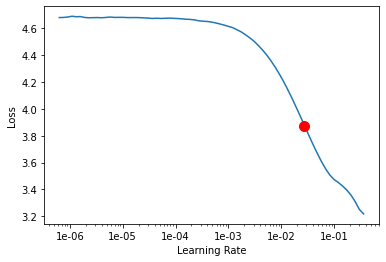

In [ ]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [ ]:
learn.fit_one_cycle(15, 4e-2)

epoch,train_loss,valid_loss,time
0,1.990782,0.651097,01:24
1,0.993253,0.581718,01:24
2,0.759770,0.598950,01:25
3,0.617567,0.529246,01:25
4,0.554515,0.543232,01:26
5,0.534690,0.537732,01:25
6,0.528287,0.528508,01:25
7,0.525337,0.536891,01:25
8,0.521201,0.519788,01:26
9,0.513886,0.517548,01:26


In [ ]:
learn.save('/content/drive/My Drive/flickr8k_search_mse')

epoch,train_loss,valid_loss,time
0,0.479260,#na#,01:22


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 2.75E-06
Min loss divided by 10: 1.45E-06


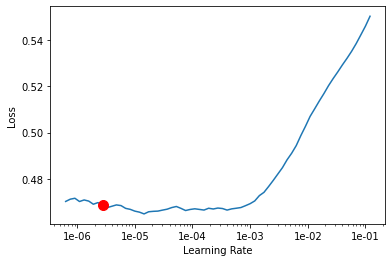

In [ ]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [ ]:
learn.fit_one_cycle(20, slice(2e-6, 4e-3))

epoch,train_loss,valid_loss,time
0,0.466074,0.477597,01:29
1,0.464114,0.476731,01:29
2,0.463276,0.478256,01:28
3,0.462485,0.480764,01:28
4,0.459201,0.482310,01:29
5,0.455696,0.483648,01:29
6,0.449494,0.485486,01:29
7,0.441180,0.487765,01:28
8,0.432459,0.483773,01:29
9,0.424113,0.485649,01:29


In [ ]:
learn.save('/content/drive/My Drive/flickr8k_search_mse')

# Search

In [ ]:
!pip install -qq nmslib

     |████████████████████████████████| 13.5MB 240kB/s 
     |████████████████████████████████| 194kB 55.9MB/s 


In [ ]:
import nmslib
 
def create_index(a):
    index = nmslib.init(space='angulardist')
    index.addDataPointBatch(a)
    index.createIndex()
    return index
 
def get_knns(index, vecs):
     return zip(*index.knnQueryBatch(vecs, k=10, num_threads=4))
 
def get_knn(index, vec): return index.knnQuery(vec, k=10)

In [ ]:
_, preds = learn.get_preds(data.train_ds)

In [ ]:
#create index of image embeddings
pred_idx = create_index(preds)

In [ ]:
def text2embedding(text_list):
    return sentence_embedder.encode(text_list)

In [ ]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.axis('off')
    return ax

def show_imgs(ims, cols, figsize=None):
    fig,axes = plt.subplots(len(ims)//cols, cols, figsize=figsize)
    for i,ax in enumerate(axes.flat): show_img(ims[i], ax=ax)
    plt.tight_layout()

## Text2Image

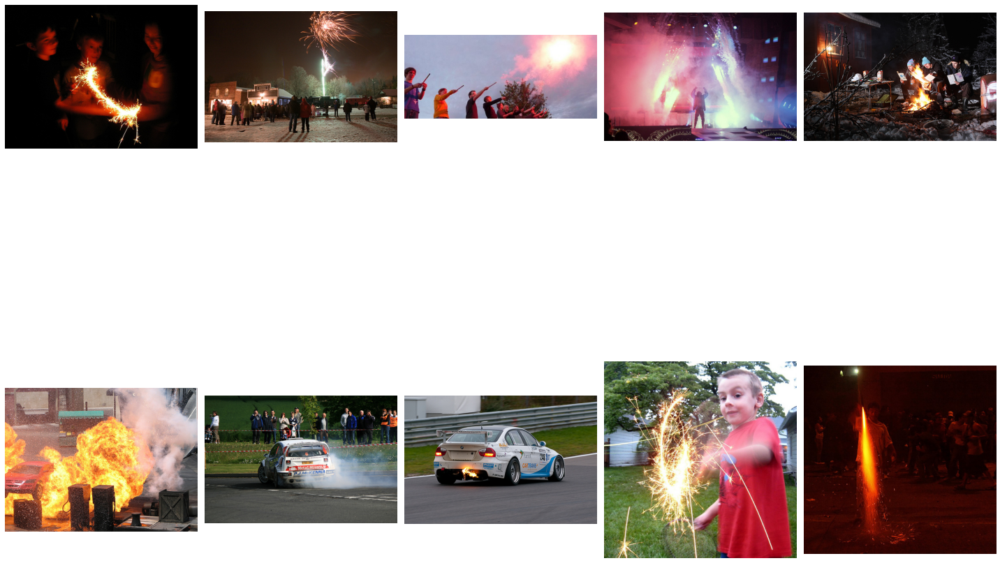

In [ ]:
vec = text2embedding('firecrackers')
idxs,dists = get_knn(pred_idx, vec)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20, 20));

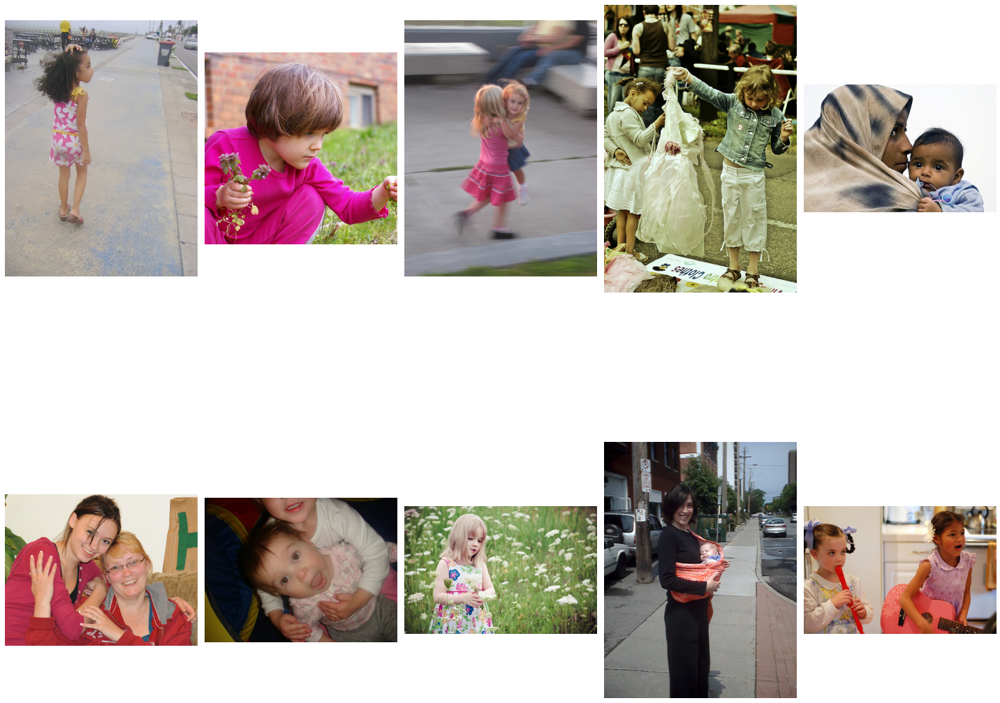

In [ ]:
vec = text2embedding('A girl holding a flower')
idxs,dists = get_knn(pred_idx, vec)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20, 20));

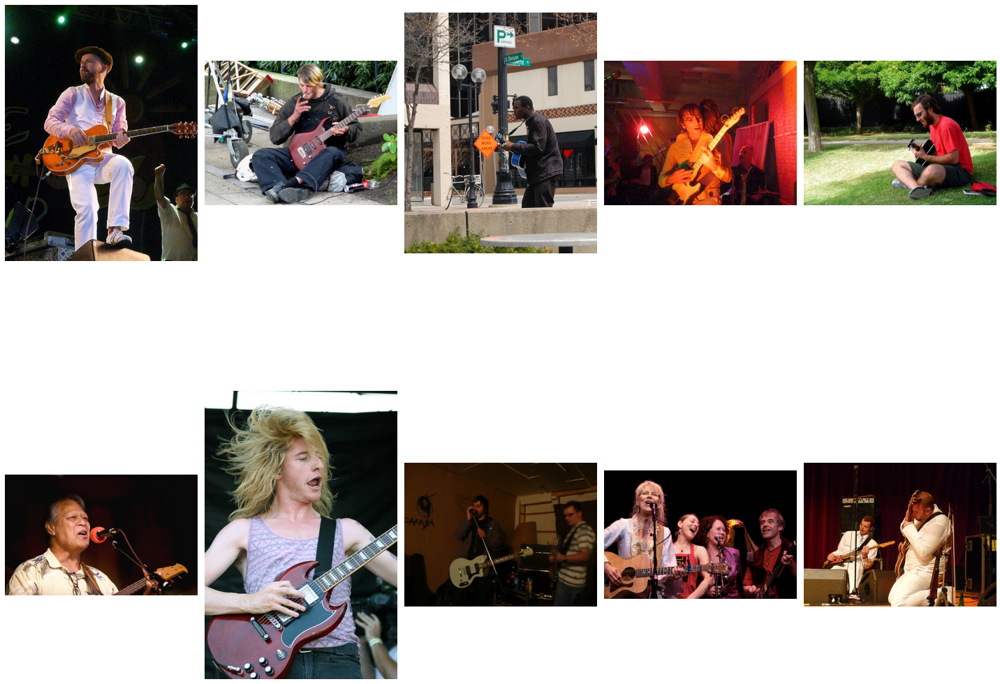

In [ ]:
vec = text2embedding('A man playing a guitar')
idxs,dists = get_knn(pred_idx, vec)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20, 20));

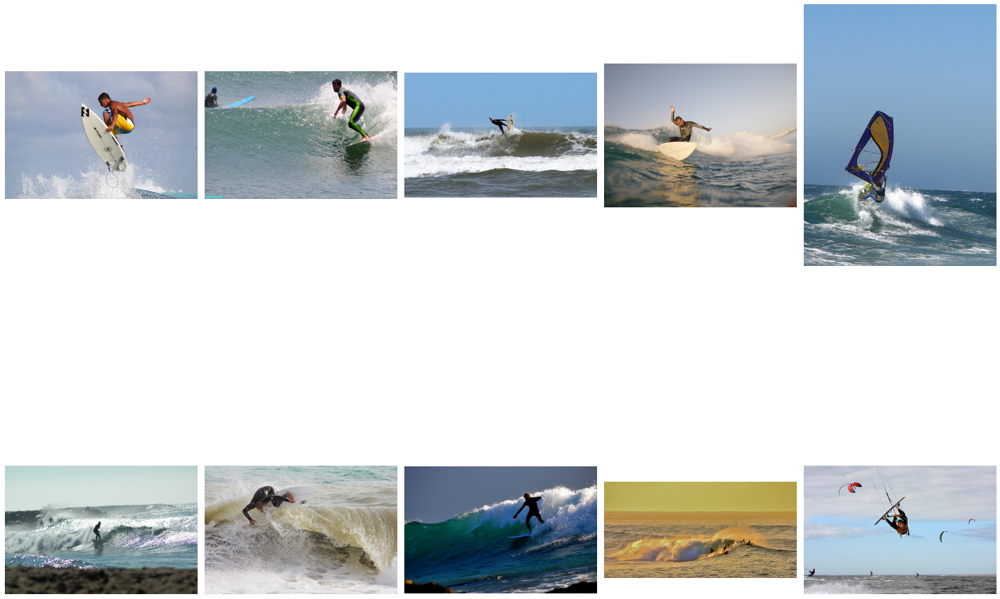

In [ ]:
vec = text2embedding('A person surfing')
idxs,dists = get_knn(pred_idx, vec)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20, 20));

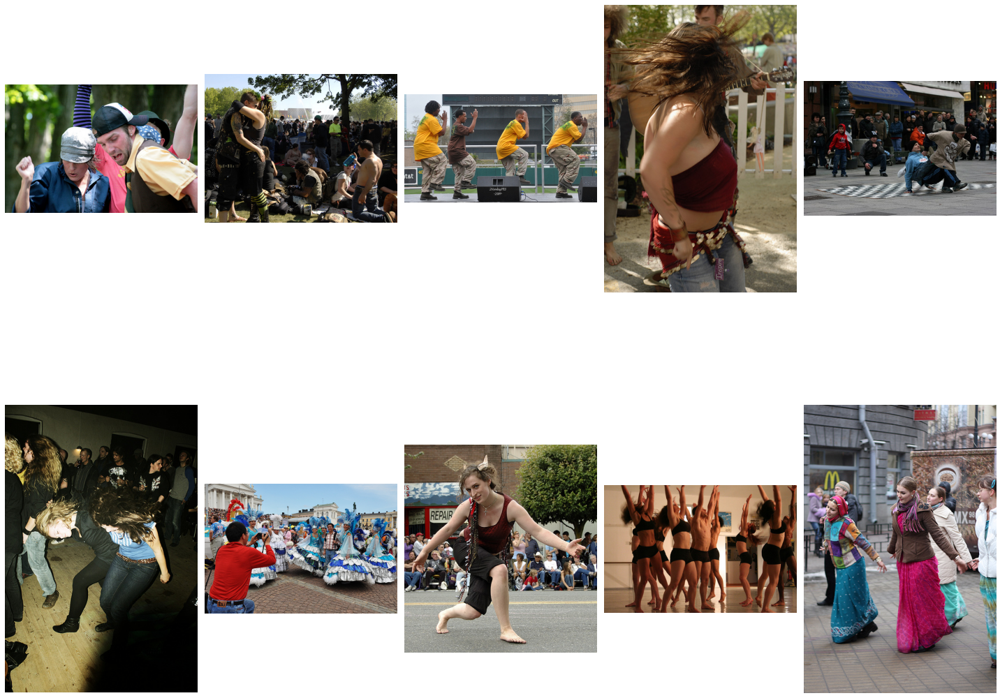

In [ ]:
vec = text2embedding('People dancing')
idxs,dists = get_knn(pred_idx, vec)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20, 20));

## Image2Image

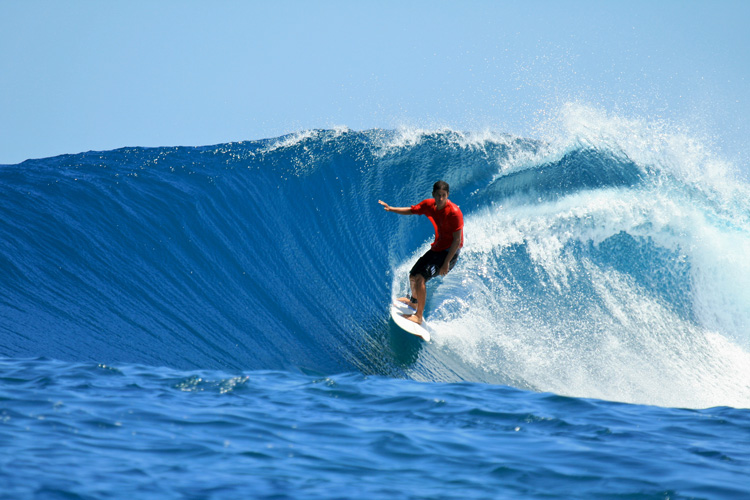

In [ ]:
response = requests.get("https://www.surfertoday.com/images/stories/surfingsport.jpg")
image_bytes = io.BytesIO(response.content)
PIL.Image.open(image_bytes)

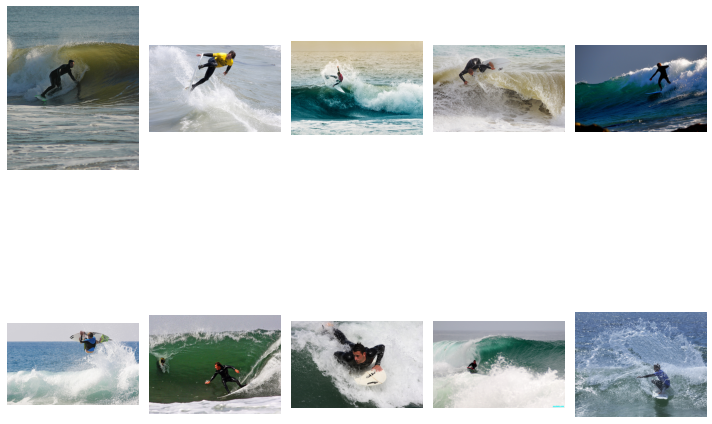

In [ ]:
_, _, pred = learn.predict(open_image(image_bytes))
idxs,dists = get_knn(pred_idx, pred)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(10,10));

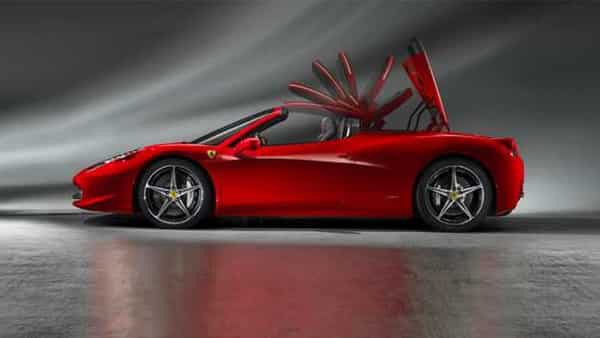

In [ ]:
url = 'https://images.hindustantimes.com/auto/img/2020/04/28/600x338/Ferrari_1588047330086_1588047330376.png'
response = requests.get(url)
image_bytes = io.BytesIO(response.content)
PIL.Image.open(image_bytes)

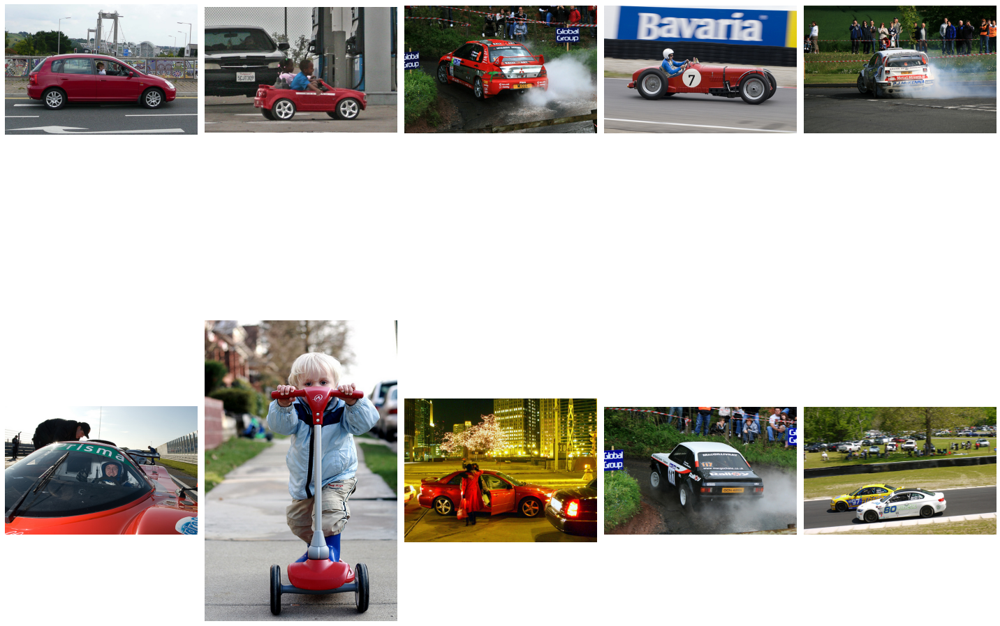

In [ ]:
_, _, pred = learn.predict(open_image(image_bytes))
idxs,dists = get_knn(pred_idx, pred)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20,20));

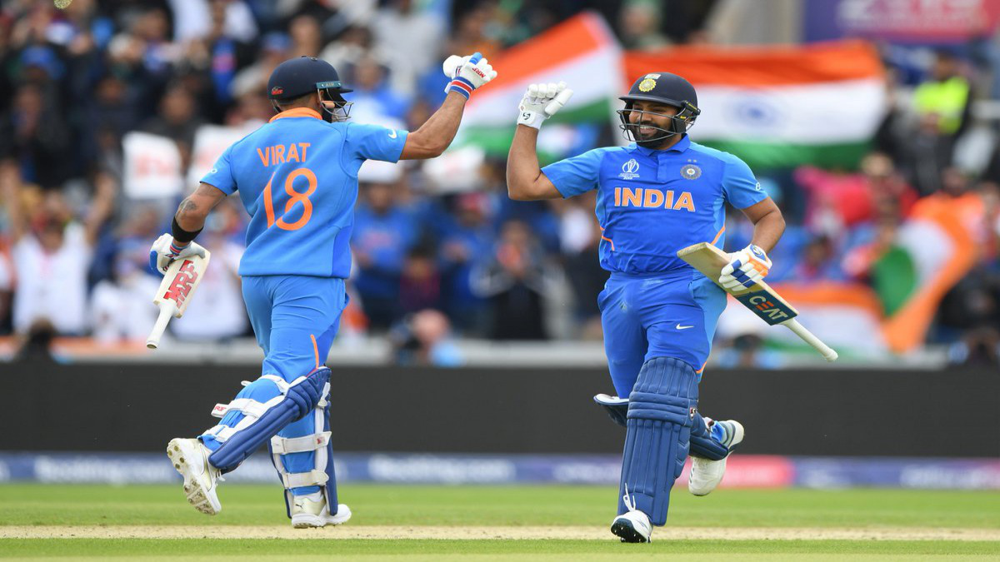

In [ ]:
url = 'https://static.theprint.in/wp-content/uploads/2019/06/D9MxwrnUwAANPby-1.jpg'
response = requests.get(url)
image_bytes = io.BytesIO(response.content)
PIL.Image.open(image_bytes)

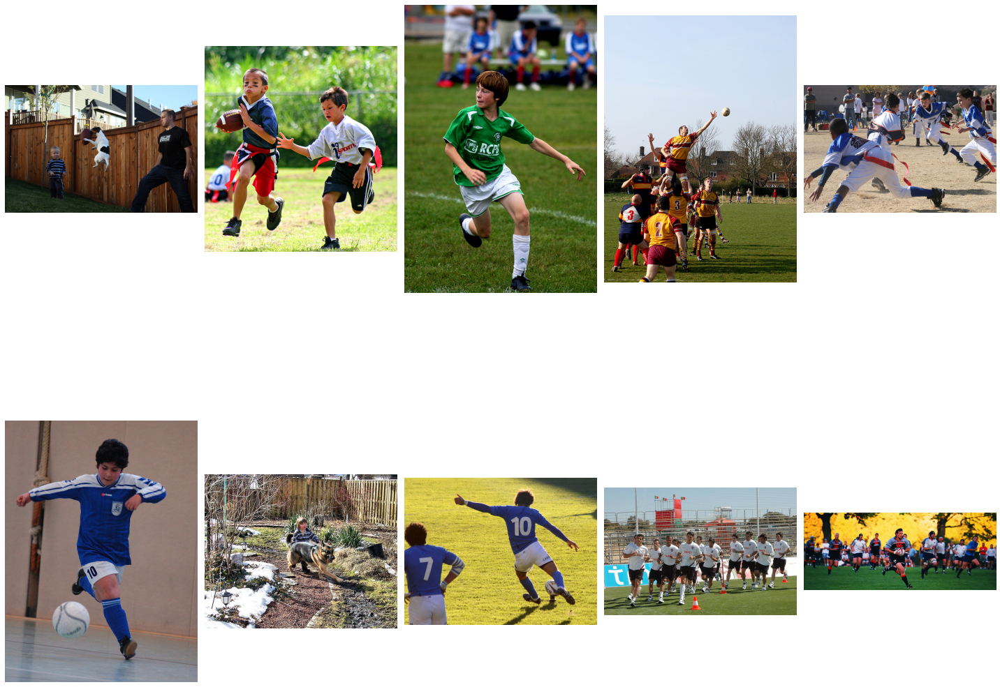

In [ ]:
_, _, pred = learn.predict(open_image(image_bytes))
idxs,dists = get_knn(pred_idx, pred)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20,20));

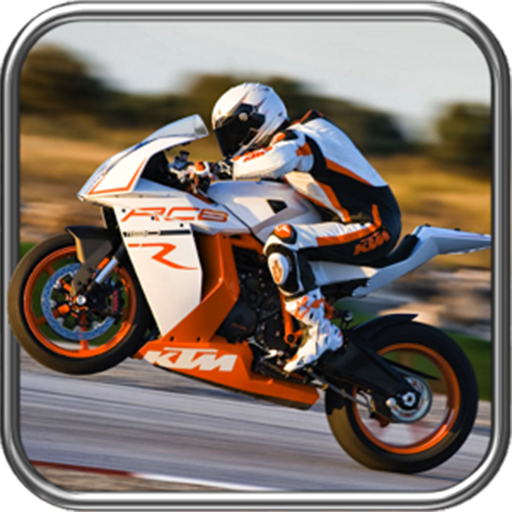

In [ ]:
url = 'https://images-na.ssl-images-amazon.com/images/I/815Qcq-3a0L.png'
response = requests.get(url)
image_bytes = io.BytesIO(response.content)
PIL.Image.open(image_bytes)

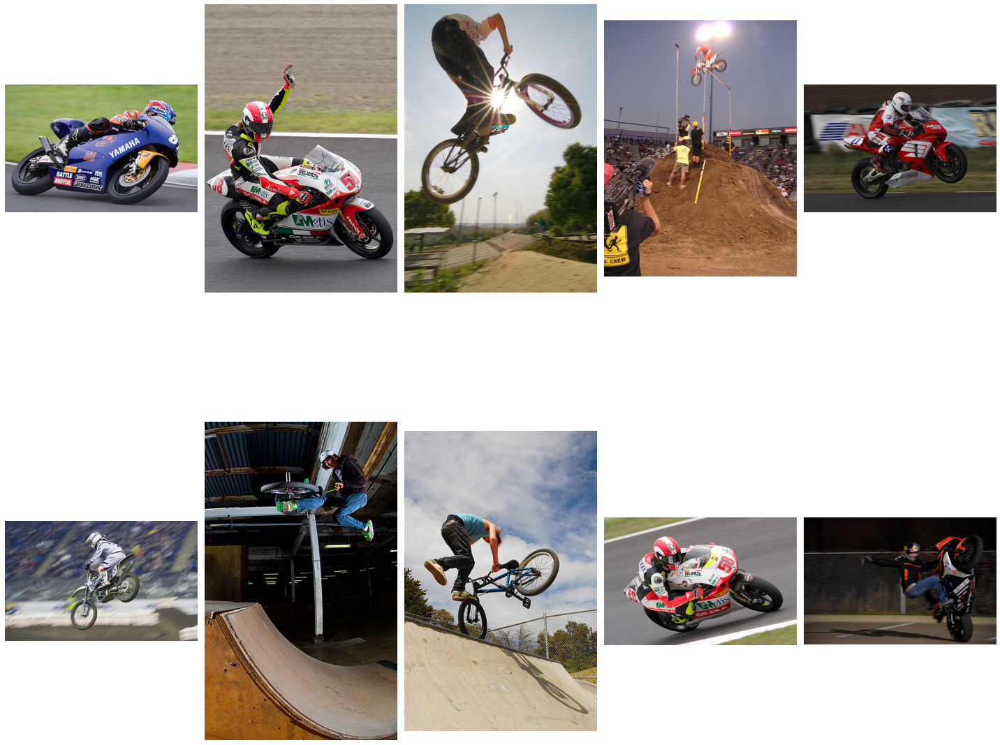

In [ ]:
_, _, pred = learn.predict(open_image(image_bytes))
idxs,dists = get_knn(pred_idx, pred)
show_imgs([PIL.Image.open(data.train_ds.items[i]) for i in idxs], 5, figsize=(20,20));